### 1. Введение.

В данном ноутбуке мы займемся исследованием рынка аппартаментов в набирающем инвестиционную привлекательность солнечном городе Сан-Паулу! Подробный отчет с интерпретацией приложен в отдельном pdf файле. Здесь речь пойдет о реализации и оптимальных методах обработки данных и обучения модели. 

Для начала импортируем все нужные нам библиотеки заранее и загрузим датасет.

In [244]:
# Импорт библиотек и настройка параметров
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import warnings
import folium
from typing import Iterable
from sklearn.base import BaseEstimator, TransformerMixin
import statsmodels.api as sm
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina'
sns.set(style='darkgrid', palette='deep')
plt.rcParams['figure.figsize'] = 12, 6
plt.rcParams['font.size'] = 12
plt.rcParams['savefig.format'] = 'pdf'


Подробнее о нашем датасете. Эти [данные](https://www.kaggle.com/datasets/marcelobatalhah/discover-so-paulo-apartment-prices-insights?resource=download) мы взяли с Kaggle. Они представляют собой парсинг с популярного в Бразилии [ресурса](https://www.zapimoveis.com.br/) с объявлениями о продаже недвижимости. Вы даже можете убедиться в этом, подставив любой ID из первого столбца таблицы в данную ссылку https://www.zapimoveis.com.br/imovel/venda-apartamento-4-quartos-paraiso-zona-sul-sao-paulo-sp-340m2-id-**2749550460**/

В качестве таргета была выбрана, конечно же, стоимость аппартаментов. Независимыми признаками выступают Area (площадь), Adress (адрес), Bedrooms (количество спален) Bathrooms (количество ванных) и Parking_Spaces (количество парковочных мест). Также мы имеем дамми-переменную below_price, означающую нахождение под нижней границей средней стоимости. Однако она нам не подходит, так как напрямую зависит от цены аппартаментов, позже заменим ее на другую. Автор парсера к тому же потрудился закодировать адреса координатами, что сильно пригодится нам в будущем. Мы будем в дальнейшем использовать координаты для составления нового категориального признака, убрав из модели Adress.

In [245]:
# Загрузка датасета
main = pd.read_csv('SaoPaulo_OnlyAppartments_2024-11-25.csv')
main.head()

,ID,created_date,Price,below_price,Area,Adress,Bedrooms,Bathrooms,Parking_Spaces,extract_date,Latitude,Longitude
0,2621660830,2021-02-08T20:20:19Z,539000,False,43,"Rua Coronel Luís Barroso 582, Santo Amaro - Sã...",1,1,1,2024-11-25,-23.647002,-46.704905
1,2751807421,2018-03-27T15:40:41Z,1649980,False,45,"Rua Diogo Jácome 955, Vila Nova Conceição - Sã...",1,1,1,2024-11-25,NaN,NaN
2,2735056019,2020-07-22T21:05:19Z,1149000,False,57,"Rua Fernão Dias 323, Pinheiros - São Paulo/SP",1,1,1,2024-11-25,-23.564136,-46.695173
3,2758506978,2024-11-12T13:41:55Z,255000,False,55,"Avenida Paes de Barros 411, Mooca - São Paulo/SP",1,1,1,2024-11-25,-23.559150,-46.599869
4,2556833428,2021-10-29T00:18:35Z,232800,False,35,"Rua Professor Artur Primavesi 154, Parque Bris...",1,1,1,2024-11-25,NaN,NaN


### 2. Обработка данных.

Важнейшим этапом в анализе данных является обработка этих самых данных. Посмотрим на типы переменных, пропуски, распределения и попробуем преобразовать наши данные, чтобы получить максимально возможную точность модели.

In [246]:
# Типы переменных
main.dtypes

ID                  int64
created_date       object
Price               int64
below_price          bool
Area                int64
Adress             object
Bedrooms            int64
Bathrooms           int64
Parking_Spaces      int64
extract_date       object
Latitude          float64
Longitude         float64
dtype: object

In [247]:
# Количество пропусков в каждом столбце
main.isna().sum()

ID                   0
created_date         0
Price                0
below_price          0
Area                 0
Adress               0
Bedrooms             0
Bathrooms            0
Parking_Spaces       0
extract_date         0
Latitude          7944
Longitude         7944
dtype: int64

### 2.1 Пропуски

Автор датасета попытался закодировать адреса координатами, но, к сожалению, почти треть координат отсутствует. Посмотрим на распределение координат без пропусков.

In [248]:
# Поиск данных без пропусков
main['Nones'] = main[['Latitude', 'Longitude']].isnull().any(axis=1).astype(int)
no_Nones = main[main['Nones'] == 0]
no_Nones.head()

,ID,created_date,Price,below_price,Area,Adress,Bedrooms,Bathrooms,Parking_Spaces,extract_date,Latitude,Longitude,Nones
0,2621660830,2021-02-08T20:20:19Z,539000,False,43,"Rua Coronel Luís Barroso 582, Santo Amaro - Sã...",1,1,1,2024-11-25,-23.647002,-46.704905,0
2,2735056019,2020-07-22T21:05:19Z,1149000,False,57,"Rua Fernão Dias 323, Pinheiros - São Paulo/SP",1,1,1,2024-11-25,-23.564136,-46.695173,0
3,2758506978,2024-11-12T13:41:55Z,255000,False,55,"Avenida Paes de Barros 411, Mooca - São Paulo/SP",1,1,1,2024-11-25,-23.559150,-46.599869,0
6,2753001806,2018-03-27T19:51:51Z,210000,False,42,"Rua Antônio Pais de Sande , Vila Mirante - São...",1,1,1,2024-11-25,-23.470334,-46.723179,0
7,2625825198,2018-03-30T02:50:40Z,640000,False,47,"Rua Doutor Jesuíno Maciel 2105, Campo Belo - S...",1,1,1,2024-11-25,-23.626811,-46.663730,0


In [249]:
# Отрисовка координат на карте
def show_circles_on_map(
    latitude_values: Iterable[float],
    longitude_values: Iterable[float],
    color: str = "blue",
) -> folium.Map:
    location = (np.mean(latitude_values), np.mean(longitude_values))
    m = folium.Map(location=location)
    
    for lat, lon in zip(latitude_values, longitude_values):
        folium.Circle(
            radius=100,
            location=(lat, lon),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)
    
    # Координаты Сан-Паулу и ближайших областей

    SanPaolo = [
        (-23.45, -46.77),        
        (-23.45, -46.5),    
        (-23.7, -46.5),
        (-23.7, -46.77),    
        (-23.45, -46.77)      
    ]

    # Координаты центра Сан-Паулу
    
    Center = [
        (-23.53, -46.67),        
        (-23.53, -46.61),    
        (-23.57, -46.61),
        (-23.57, -46.67),    
        (-23.53, -46.67)  
    ]

    folium.PolyLine(
        locations=SanPaolo,
        color='red',
        weight=2
    ).add_to(m)

    folium.PolyLine(
        locations=Center,
        color='orange',
        weight=2
    ).add_to(m)
    
    return m


In [250]:
# Сэмплирование 10 000 наблюдений
def sample(df):
    smpl = df.sample(10000)
    return smpl.Latitude, smpl.Longitude

func = sample(no_Nones)
your_lat_values, your_lon_values = func[0], func[1]
show_circles_on_map(your_lat_values, your_lon_values, color="midnightblue")

Заметим, что город плотно покрыт точками. Можем удалить из данных наблюдения с пропусками. Также можно заметить выбросы: в датасете находятся апартаменты, находящиеся далеко за границами Сан-Паулу. Оставим в датасете строки с координатами, входящими в красный квадрат: Сан-Паулу и ближайший пригород.

Помните, что дамми-переменная below_price нам не подходит? Давайте определим новую: расположенность в центре Сан-Паулу. В нее войдут точки, находящиеся в оранжевом квадрате. Позже мы увидим, как это влияет на цену аппартаментов.

In [251]:
# Оставляем точки в красном квадрате
main = no_Nones
main = main.drop(columns='Nones')
main = main[
    (main['Latitude'] >= -23.7) & 
    (main['Latitude'] <= -23.45) & 
    (main['Longitude'] >= -46.77) & 
    (main['Longitude'] <= -46.5)]
main

,ID,created_date,Price,below_price,Area,Adress,Bedrooms,Bathrooms,Parking_Spaces,extract_date,Latitude,Longitude
0,2621660830,2021-02-08T20:20:19Z,539000,False,43,"Rua Coronel Luís Barroso 582, Santo Amaro - Sã...",1,1,1,2024-11-25,-23.647002,-46.704905
2,2735056019,2020-07-22T21:05:19Z,1149000,False,57,"Rua Fernão Dias 323, Pinheiros - São Paulo/SP",1,1,1,2024-11-25,-23.564136,-46.695173
3,2758506978,2024-11-12T13:41:55Z,255000,False,55,"Avenida Paes de Barros 411, Mooca - São Paulo/SP",1,1,1,2024-11-25,-23.559150,-46.599869
6,2753001806,2018-03-27T19:51:51Z,210000,False,42,"Rua Antônio Pais de Sande , Vila Mirante - São...",1,1,1,2024-11-25,-23.470334,-46.723179
7,2625825198,2018-03-30T02:50:40Z,640000,False,47,"Rua Doutor Jesuíno Maciel 2105, Campo Belo - S...",1,1,1,2024-11-25,-23.626811,-46.663730
...,...,...,...,...,...,...,...,...,...,...,...,...
24456,2674023531,2018-03-27T18:58:56Z,1115000,True,97,"Rua Doutor José Áureo Bustamante 183, Santo Am...",2,3,2,2024-11-25,-23.623689,-46.697266
24457,2734782814,2018-03-27T17:00:22Z,1064000,True,116,"Rua Coriolano 1852, Vila Romana - São Paulo/SP",2,3,2,2024-11-25,-23.525395,-46.703616
24458,2758956913,2022-07-14T14:09:30Z,1499990,False,78,"Avenida Lins de Vasconcelos 3305, Vila Mariana...",2,3,2,2024-11-25,-23.588174,-46.630954
24462,2567711455,2018-03-27T16:01:19Z,2120000,False,95,"Rua Deputado Lacerda Franco 144, Pinheiros - S...",2,3,2,2024-11-25,-23.563501,-46.689880


In [252]:
# Ищем точки в центре
main.loc[
    (main['Latitude'] >= -23.57) & 
    (main['Latitude'] <= -23.53) & 
    (main['Longitude'] >= -46.67) & 
    (main['Longitude'] <= -46.61),
    'Center'
] = True
main['Center'] = main.Center.fillna(False)
main

,ID,created_date,Price,below_price,Area,Adress,Bedrooms,Bathrooms,Parking_Spaces,extract_date,Latitude,Longitude,Center
0,2621660830,2021-02-08T20:20:19Z,539000,False,43,"Rua Coronel Luís Barroso 582, Santo Amaro - Sã...",1,1,1,2024-11-25,-23.647002,-46.704905,False
2,2735056019,2020-07-22T21:05:19Z,1149000,False,57,"Rua Fernão Dias 323, Pinheiros - São Paulo/SP",1,1,1,2024-11-25,-23.564136,-46.695173,False
3,2758506978,2024-11-12T13:41:55Z,255000,False,55,"Avenida Paes de Barros 411, Mooca - São Paulo/SP",1,1,1,2024-11-25,-23.559150,-46.599869,False
6,2753001806,2018-03-27T19:51:51Z,210000,False,42,"Rua Antônio Pais de Sande , Vila Mirante - São...",1,1,1,2024-11-25,-23.470334,-46.723179,False
7,2625825198,2018-03-30T02:50:40Z,640000,False,47,"Rua Doutor Jesuíno Maciel 2105, Campo Belo - S...",1,1,1,2024-11-25,-23.626811,-46.663730,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24456,2674023531,2018-03-27T18:58:56Z,1115000,True,97,"Rua Doutor José Áureo Bustamante 183, Santo Am...",2,3,2,2024-11-25,-23.623689,-46.697266,False
24457,2734782814,2018-03-27T17:00:22Z,1064000,True,116,"Rua Coriolano 1852, Vila Romana - São Paulo/SP",2,3,2,2024-11-25,-23.525395,-46.703616,False
24458,2758956913,2022-07-14T14:09:30Z,1499990,False,78,"Avenida Lins de Vasconcelos 3305, Vila Mariana...",2,3,2,2024-11-25,-23.588174,-46.630954,False
24462,2567711455,2018-03-27T16:01:19Z,2120000,False,95,"Rua Deputado Lacerda Franco 144, Pinheiros - S...",2,3,2,2024-11-25,-23.563501,-46.689880,False


In [253]:
# Пропусков не осталось
main.isna().sum()

ID                0
created_date      0
Price             0
below_price       0
Area              0
Adress            0
Bedrooms          0
Bathrooms         0
Parking_Spaces    0
extract_date      0
Latitude          0
Longitude         0
Center            0
dtype: int64

### 2.2 Распределения

Пропусков в данных больше нет. Посмотрим на распределение таргета и оставшихся признаков.

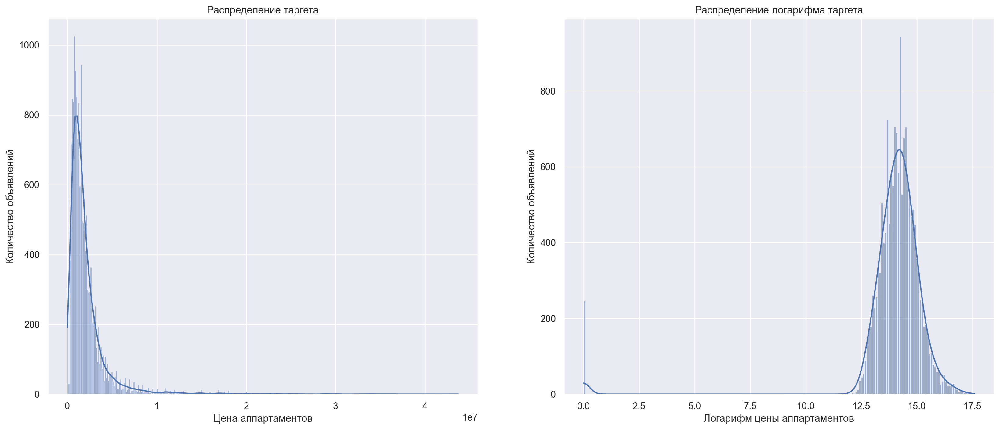

In [254]:
# Строим распределение таргета и его логарифма
fig, axes = plt.subplots(1, 2, figsize=(20, 8))
sns.histplot(main.Price, kde=True, ax=axes[0])
axes[0].set(title="Распределение таргета",
            xlabel="Цена аппартаментов", ylabel="Количество объявлений")
sns.histplot(np.log1p(main.Price), kde=True, ax=axes[1])
axes[1].set(title="Распределение логарифма таргета",
            xlabel="Логарифм цены аппартаментов", ylabel="Количество объявлений")
plt.show()

Распределение таргета не симметричное и имеет тяжелые хвосты справа. Кажется, логарифм цены автомобиля распределен более "нормально", поэтому обозначим его новым таргетом. 

При нормальности целевой переменной и остатков линейная регрессия дает несмещенные, эффективные и состоятельные оценки параметров (метод наименьших квадратов становится оптимальным). Это связано с тем, что метод МНК лучше работает в условиях нормального распределения.

Модель будет более точной. Но для начала откинем выбросы. На графике видно, что присутствуют аппартаменты с аномально низкой стоимостью. Отсутствие таких выбросов увеличит точность модели. Воспользуемся квантилем.

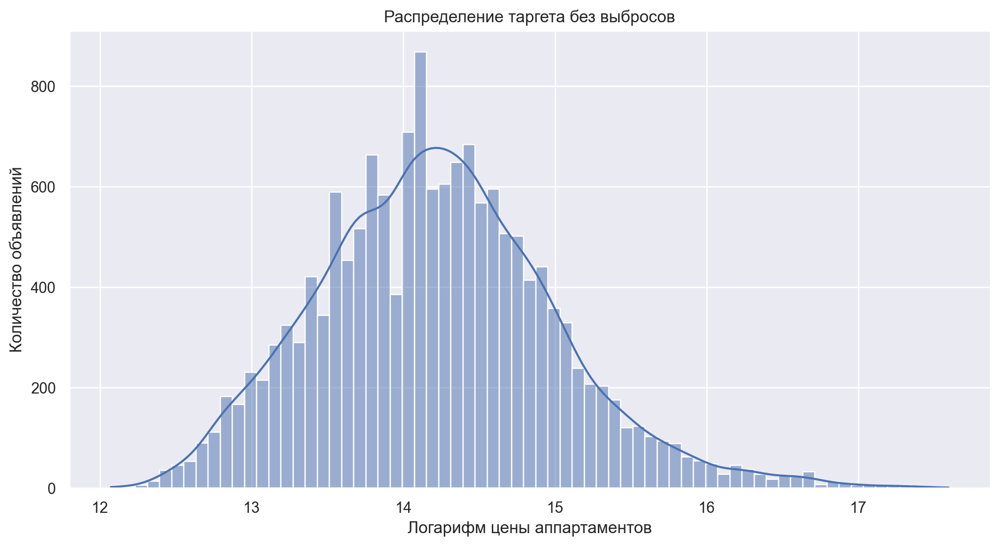

In [255]:
# Отрезаем выбросы
main["log_Price"] = np.log1p(main.Price)
no_emissions = main[main.log_Price >= main.log_Price.quantile(0.0156)]
sns.histplot(no_emissions.log_Price, kde=True)
plt.title("Распределение таргета без выбросов")
plt.xlabel("Логарифм цены аппартаментов")
plt.ylabel("Количество объявлений")
plt.show()

In [256]:
main = no_emissions
main.head()

,ID,created_date,Price,below_price,Area,Adress,Bedrooms,Bathrooms,Parking_Spaces,extract_date,Latitude,Longitude,Center,log_Price
0,2621660830,2021-02-08T20:20:19Z,539000,False,43,"Rua Coronel Luís Barroso 582, Santo Amaro - Sã...",1,1,1,2024-11-25,-23.647002,-46.704905,False,13.197473
2,2735056019,2020-07-22T21:05:19Z,1149000,False,57,"Rua Fernão Dias 323, Pinheiros - São Paulo/SP",1,1,1,2024-11-25,-23.564136,-46.695173,False,13.954403
3,2758506978,2024-11-12T13:41:55Z,255000,False,55,"Avenida Paes de Barros 411, Mooca - São Paulo/SP",1,1,1,2024-11-25,-23.559150,-46.599869,False,12.449023
6,2753001806,2018-03-27T19:51:51Z,210000,False,42,"Rua Antônio Pais de Sande , Vila Mirante - São...",1,1,1,2024-11-25,-23.470334,-46.723179,False,12.254868
7,2625825198,2018-03-30T02:50:40Z,640000,False,47,"Rua Doutor Jesuíno Maciel 2105, Campo Belo - S...",1,1,1,2024-11-25,-23.626811,-46.663730,False,13.369225


С целевой переменной разобрались. Посмотрим на распределение категориальных признаков. Но для начала определим количество уникальных значений для каждого из них.

In [257]:
# Уникальные значения
for categorical in ['Center', 'Adress', 'Bedrooms', 'Bathrooms', 'Parking_Spaces']:
    print("unique", categorical, "-", main[categorical].nunique())

unique Center - 2
unique Adress - 8386
unique Bedrooms - 10
unique Bathrooms - 12
unique Parking_Spaces - 20


Построим графики распределений для категориальных признаков с адекватным количеством уникальных значений и обработаем выбросы.

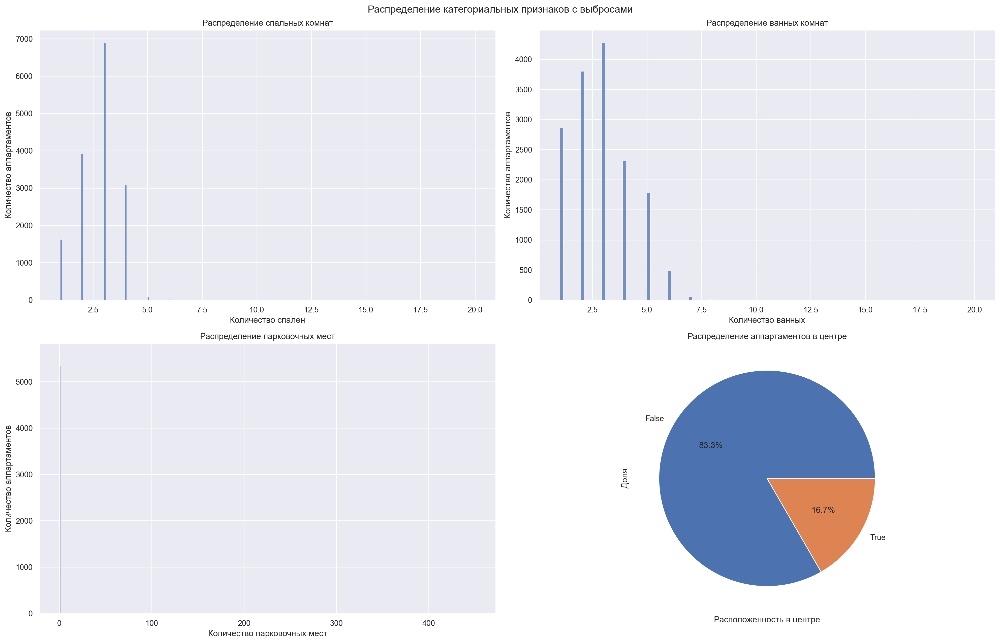

In [258]:
# Распределения категориальных признаков с выбросами
fig, axes = plt.subplots(2, 2, figsize=(20, 13))
fig.suptitle('Распределение категориальных признаков с выбросами')
sns.histplot(main.Bedrooms, ax=axes[0, 0])
axes[0, 0].set(title="Распределение спальных комнат",
            xlabel="Количество спален", ylabel="Количество аппартаментов")
sns.histplot(main.Bathrooms, ax=axes[0, 1])
axes[0, 1].set(title="Распределение ванных комнат",
            xlabel="Количество ванных", ylabel="Количество аппартаментов")
sns.histplot(main.Parking_Spaces, ax=axes[1, 0])
axes[1, 0].set(title="Распределение парковочных мест",
            xlabel="Количество парковочных мест", ylabel="Количество аппартаментов")
main.Center.value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1])
axes[1, 1].set(title="Распределение аппартаментов в центре",
            xlabel="Расположенность в центре", ylabel="Доля")
plt.tight_layout()
plt.show()


Выбросов много. Разберемся с ними и снова построим графики.

In [259]:
# Удаляем выбросы
main = main[main.Bedrooms <= 7]
main = main[main.Bathrooms <= 8]
main = main[main.Parking_Spaces <= 10]

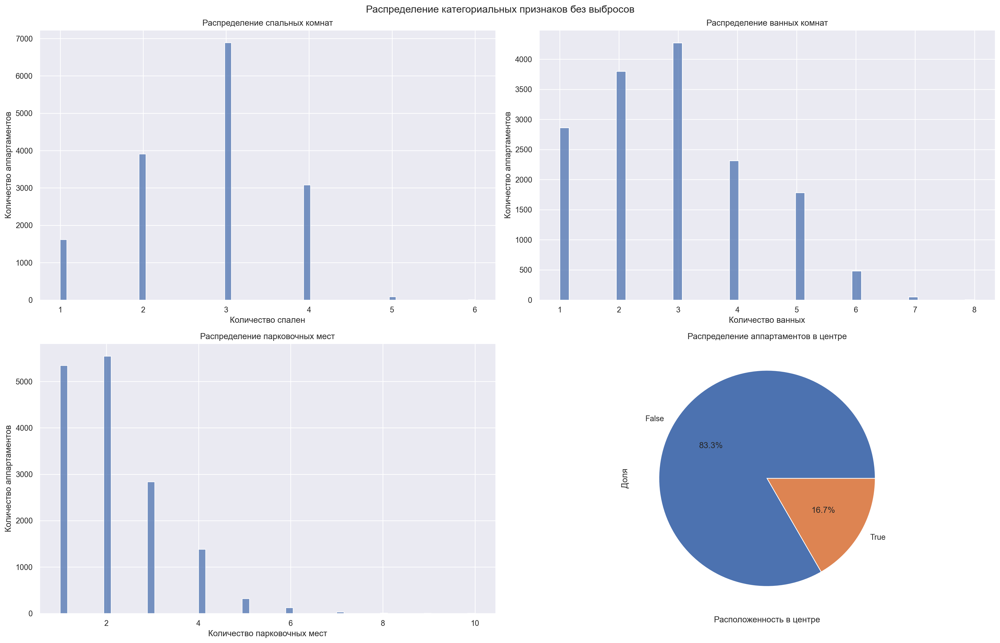

In [260]:
# Распределения категориальных признаков без выбросов
fig, axes = plt.subplots(2, 2, figsize=(20, 13))
fig.suptitle('Распределение категориальных признаков без выбросов')
sns.histplot(main.Bedrooms, ax=axes[0, 0])
axes[0, 0].set(title="Распределение спальных комнат",
            xlabel="Количество спален", ylabel="Количество аппартаментов")
sns.histplot(main.Bathrooms, ax=axes[0, 1])
axes[0, 1].set(title="Распределение ванных комнат",
            xlabel="Количество ванных", ylabel="Количество аппартаментов")
sns.histplot(main.Parking_Spaces, ax=axes[1, 0])
axes[1, 0].set(title="Распределение парковочных мест",
            xlabel="Количество парковочных мест", ylabel="Количество аппартаментов")
main.Center.value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1])
axes[1, 1].set(title="Распределение аппартаментов в центре",
            xlabel="Расположенность в центре", ylabel="Доля")
plt.tight_layout()
plt.show()


Другое дело! Так мы избавились от выбросов в категориальных признаках. Посмотрим на распределение единственного числового признака - площадь.

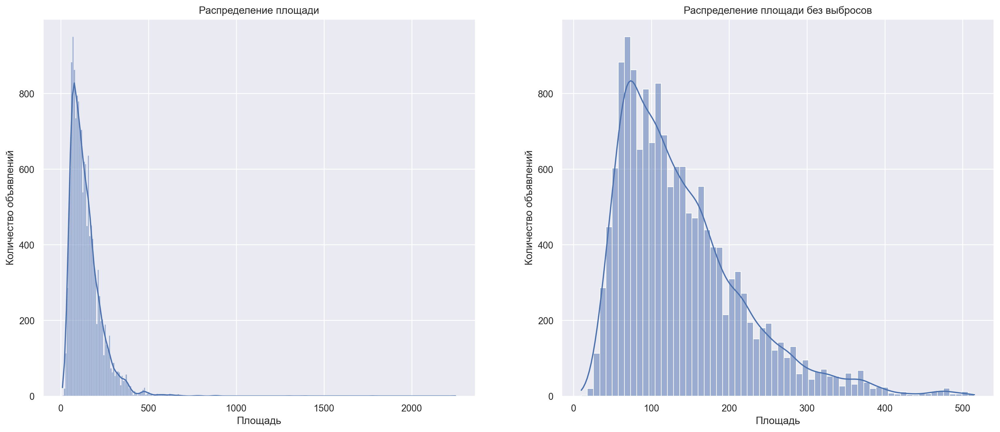

In [261]:
# Строим распределение таргета и его логарифма
fig, axes = plt.subplots(1, 2, figsize=(20, 8))
sns.histplot(main.Area, kde=True, ax=axes[0])
axes[0].set(title="Распределение площади",
            xlabel="Площадь", ylabel="Количество объявлений")
no_emissions = main[main.Area <= main.Area.quantile(0.995)]
sns.histplot(no_emissions.Area, kde=True, ax=axes[1])
axes[1].set(title="Распределение площади без выбросов",
            xlabel="Площадь", ylabel="Количество объявлений")
plt.show()

Опять видим тяжелые хвосты справа. Отрежем с помощью квантили и избавимся от выбросов.

In [262]:
main = no_emissions

Но что делать с адресами? Слишком большое количество уникальных значений, хотя признак действительно кажется важным. Для этого нам и нужны были координаты. Разобьем красный квадрат на сетку и каждому наблюдению присвоим номер сетки, куда он попал. Для этого воспользуемся классом из домашнего задания по МО-1, созданного с помощью ChatGPT. 

In [263]:
# ChatGPT класс для разбиения точек на карте по квадратам
import folium
import numpy as np
from typing import Iterable
from sklearn.base import BaseEstimator, TransformerMixin

class MapGridTransformer(BaseEstimator, TransformerMixin): 
    def __init__(self, long, lat): 
        self.rows = 6
        self.long = long
        self.lat = lat
        self.columns = 6
        self.borders = (-46.77, -23.7, -46.5, -23.45) 
        self.x_min, self.y_min, self.x_max, self.y_max = self.borders
        self.width = (self.x_max - self.x_min) / self.columns 
        self.height = (self.y_max - self.y_min) / self.rows 
     
    def _get_cell_number(self, lon, lat):
        col = ((lon - self.x_min) / self.width).astype(int) 
        row = ((lat - self.y_min) / self.height).astype(int) 
        mask = (col >= 0) & (col < self.columns) & (row >= 0) & (row < self.rows)
        cell = np.where(mask, row * self.columns + col, -1)
        return cell 
     
    def transform(self, x_train): 
        x_trans = x_train.copy()
        x_trans["Coord_cell"] = self._get_cell_number(x_trans[self.long], x_trans[self.lat])
        return x_trans 
     
    def show_map(self, latitude_values: Iterable[float], longitude_values: Iterable[float]):
        location = (np.mean(latitude_values), np.mean(longitude_values)) 
        m = folium.Map(location=location, zoom_start=13) 
        
        # Отображаем сетку
        for i in range(self.rows): 
            for j in range(self.columns): 
                lat_start = self.y_min + i * self.height 
                lon_start = self.x_min + j * self.width 
                lat_end = lat_start + self.height 
                lon_end = lon_start + self.width 
                
                # Добавляем прямоугольник для каждой ячейки
                folium.Rectangle( 
                    bounds=[(lat_start, lon_start), (lat_end, lon_end)], 
                    color="red", 
                    weight=1, 
                    fill=False 
                ).add_to(m)
                
                
                center_lat = (lat_start + lat_end) / 2
                center_lon = (lon_start + lon_end) / 2
                
                cell_number = i * self.columns + j
                folium.Marker(
                    location=(center_lat, center_lon),
                    popup=str(cell_number), 
                    tooltip="Cell " + str(cell_number),
                    icon=folium.DivIcon(
                        html=f'<div style="font-size: 12pt; color: black; font-weight: bold;">{cell_number}</div>'
                    )
                ).add_to(m)
        
        for lat, lon in zip(latitude_values, longitude_values): 
            folium.Circle( 
                radius=100, 
                location=(lat, lon), 
                color="blue", 
                fill_color="blue", 
                fill=True 
            ).add_to(m) 
        
        return m


In [264]:
trans = MapGridTransformer('Longitude', 'Latitude') 
map = trans.show_map(main.Latitude[:10000],  main.Longitude[:10000]) 
map

In [265]:
main = trans.transform(main) 

### 2.3 Зависимости.

Давайте наконец построим графики зависимости логарифма цены аппартаментов от независимых признаков.
Начнем с числового признака - площади.

Корреляция площади и цены на аппартаменты: 0.7562793644187994


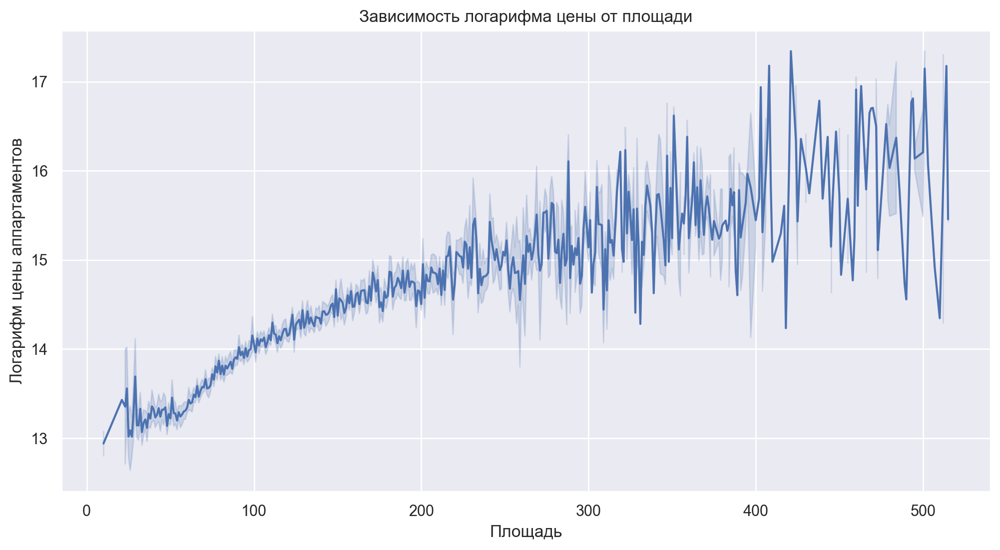

In [266]:
print("Корреляция площади и цены на аппартаменты:", main.log_Price.corr(main.Area))
sns.lineplot(y=main.log_Price, x=main.Area)
plt.title('Зависимость логарифма цены от площади')
plt.xlabel('Площадь')
plt.ylabel('Логарифм цены аппартаментов')
plt.show()

Наблюдается сильная положительная линейная связь, о чем нам также говорит корреляция площади и цены на аппартаменты. Однако по мере увеличения площади рост цен замедляется и график становится шумным.

Перейдем к категориальным признакам. Для них изобразим ящики с усами.

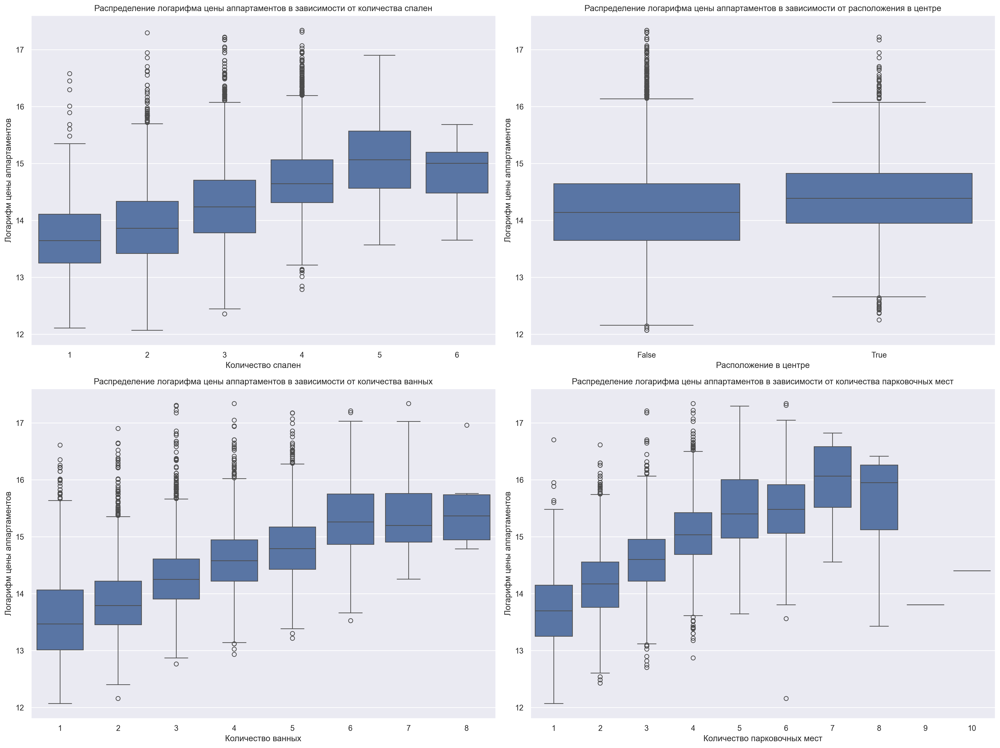

In [267]:
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
sns.boxplot(x="Bedrooms", y="log_Price", data=main, ax=axes[0, 0])
axes[0, 0].set(title="Распределение логарифма цены аппартаментов в зависимости от количества спален",
                xlabel="Количество спален", ylabel="Логарифм цены аппартаментов")
sns.boxplot(x="Center", y="log_Price", data=main, ax=axes[0, 1])
axes[0, 1].set(title="Распределение логарифма цены аппартаментов в зависимости от расположения в центре",
                xlabel="Расположение в центре", ylabel="Логарифм цены аппартаментов")
sns.boxplot(x="Bathrooms", y="log_Price", data=main, ax=axes[1, 0])
axes[1, 0].set(title="Распределение логарифма цены аппартаментов в зависимости от количества ванных",
                xlabel="Количество ванных", ylabel="Логарифм цены аппартаментов")
sns.boxplot(x="Parking_Spaces", y="log_Price", data=main, ax=axes[1, 1])
axes[1, 1].set(title="Распределение логарифма цены аппартаментов в зависимости от количества парковочных мест",
                xlabel="Количество парковочных мест", ylabel="Логарифм цены аппартаментов")
plt.tight_layout()
plt.show()

Кажется, ванные, спальни и парковочные места имеют что-то похожее на линейную зависимость. Может, сделаем эти признаки числовыми?

Посмотрим, что дало нам разделение города на квадраты.

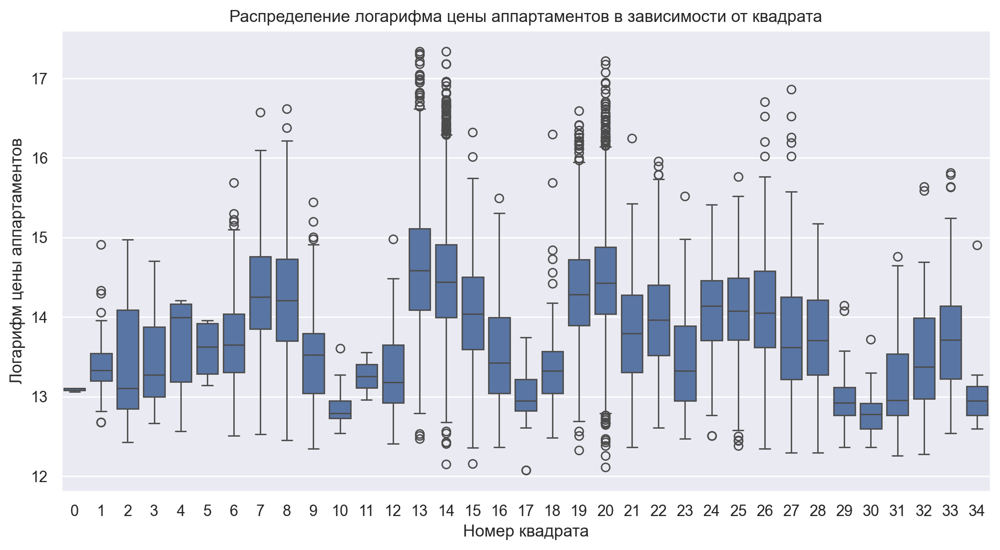

In [268]:
sns.boxplot(x="Coord_cell", y="log_Price", data=main)
plt.title("Распределение логарифма цены аппартаментов в зависимости от квадрата")
plt.xlabel("Номер квадрата")
plt.ylabel("Логарифм цены аппартаментов")
plt.show()

Думаю, данные дамми-переменные окажутся весьма полезными. На графике видна большая разрозненность.

Давайте также построим корреляционную матрицу.

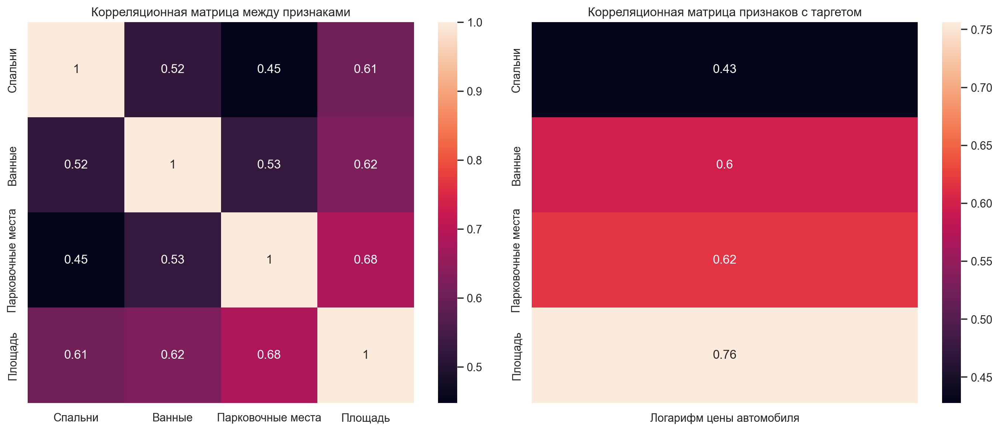

In [269]:
numeric = ["Bedrooms", "Bathrooms", "Parking_Spaces", "Area"]
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(main[numeric].corr(), annot=True, ax=axes[0])
axes[0].set(title="Корреляционная матрица между признаками", yticklabels=["Спальни", "Ванные", "Парковочные места", "Площадь"],
             xticklabels=["Спальни", "Ванные", "Парковочные места", "Площадь"])
sns.heatmap(main[numeric].corrwith(main.log_Price).to_frame("Логарифм цены автомобиля"), annot=True, ax=axes[1])
axes[1].set(title="Корреляционная матрица признаков с таргетом", yticklabels=["Спальни", "Ванные", "Парковочные места", "Площадь"])
plt.tight_layout()
plt.show()

У признаков наблюдается средняя положительная корреляция между друг другом, что, в целом, логично: например, чем больше площадь, тем больше спален. Это плохо отразится на точности модели, но что поделать.

Между признаками и таргетом так же наблюдается средняя и сильная положительная корреляция, что хорошо скажется на точности модели.

Осталось реализовать еще одну идею. На официальном сайте префектуры Сан-Паулу мы нашли датасет с медицинскими учреждениями и их координатами. Влияет ли близость аппартаментов к больницам на их цену?

In [270]:
# Считываем датасет
meds = pd.read_csv('deinfosacadsau2014.csv', encoding='latin1', sep=',')
meds = meds.rename(columns={'LONG': 'LONGITUDE', 'LAT': 'LATITUDE'})
meds

,ID,LONGITUDE,LATITUDE,SETCENS,AREAP,CODDIST,DISTRITO,CODSUBPREF,SUBPREF,REGIAO5,...,TELEFONE,CEP,CNES,SA_DEPADM,DEPADM,SA_TIPO,TIPO,SA_CLASSE,CLASSE,LEITOS
0,1,-46490063,-23522787,355030864000052,3550308005143,65,PONTE RASA,22,ERMELINO MATARAZZO,Leste,...,22800080.0,3680000.0,6393608.000000,1,Municipal,49,AMA ESPECIALIDADES,1,AMBULATORIOS ESPECIALIZADOS,0
1,2,-46773393,-23673297,355030819000016,3550308005232,19,CAPAO REDONDO,17,CAMPO LIMPO,Sul,...,58742846.0,5666000.0,6194974.000000,1,Municipal,49,AMA ESPECIALIDADES,1,AMBULATORIOS ESPECIALIZADOS,0
2,3,-46651898,-23531575,355030869000001,3550308005027,70,SANTA CECILIA,9,SE,Centro,...,38260096.0,1153000.0,6138314.000000,1,Municipal,49,AMA ESPECIALIDADES,1,AMBULATORIOS ESPECIALIZADOS,0
3,4,-46454974,-23538945,355030837000019,3550308005202,36,ITAQUERA,27,ITAQUERA,Leste,...,62860015.0,8210090.0,6394558.000000,1,Municipal,49,AMA ESPECIALIDADES,1,AMBULATORIOS ESPECIALIZADOS,0
4,5,-46539564,-23599363,355030872000050,3550308005158,74,SAO LUCAS,29,VILA PRUDENTE,Leste,...,NaN,3244030.0,6759998.000000,1,Municipal,49,AMA ESPECIALIDADES,1,AMBULATORIOS ESPECIALIZADOS,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1462,1464,-46603666,-23555505,355030853000023,3550308005018,54,MOOCA,25,MOOCA,Leste,...,22929512.0,3112090.0,2751917.000000,1,Municipal,17,UNIDADE DE REFERENCIA SAUDE DO IDOSO,1,AMBULATORIOS ESPECIALIZADOS,0
1463,1465,-46709954,-23641851,355030871000035,3550308005174,72,SANTO AMARO,14,SANTO AMARO,Sul,...,55483152.0,4727000.0,6167403.000000,1,Municipal,17,UNIDADE DE REFERENCIA SAUDE DO IDOSO,1,AMBULATORIOS ESPECIALIZADOS,0
1464,1466,-46651898,-23531575,355030869000001,3550308005027,70,SANTA CECILIA,9,SE,Centro,...,38260096.0,1153000.0,2752336.000000,1,Municipal,17,UNIDADE DE REFERENCIA SAUDE DO IDOSO,1,AMBULATORIOS ESPECIALIZADOS,0
1465,1467,-46432853,-23551447,355030837000019,3550308005202,36,ITAQUERA,27,ITAQUERA,Leste,...,NaN,8255010.0,2815478,1,Municipal,44,SUPERVISAO DE VIGILANCIA EM SAUDE,4,VIGILANCIA EM SAUDE,0


In [271]:
# Преобразуем датасет в нужный нам формат
meds = meds[['LATITUDE', 'LONGITUDE']]
meds["LATITUDE"] = meds["LATITUDE"].astype(str).str[:3] + "." + meds["LATITUDE"].astype(str).str[3:]
meds["LONGITUDE"] = meds["LONGITUDE"].astype(str).str[:3] + "." + meds["LONGITUDE"].astype(str).str[3:]
meds["LATITUDE"] = meds["LATITUDE"].astype(float)
meds["LONGITUDE"] = meds["LONGITUDE"].astype(float)
meds = meds[
    (meds['LATITUDE'] >= -23.7) & 
    (meds['LATITUDE'] <= -23.45) & 
    (meds['LONGITUDE'] >= -46.77) & 
    (meds['LONGITUDE'] <= -46.5)]
meds

,LATITUDE,LONGITUDE
2,-23.531575,-46.651898
4,-23.599363,-46.539564
6,-23.630816,-46.766027
7,-23.659403,-46.743017
10,-23.497448,-46.654057
...,...,...
1461,-23.462448,-46.623105
1462,-23.555505,-46.603666
1463,-23.641851,-46.709954
1464,-23.531575,-46.651898


In [272]:
# Рисуем распределение медицинских учреждений на карте
trans = MapGridTransformer('LONGITUDE', 'LATITUDE') 
map = trans.show_map(meds['LATITUDE'][:926],  meds['LONGITUDE'][:926]) 
map

In [273]:
# Найдем количество больниц в каждом квадрате
meds = trans.transform(meds) 
meds_counts = meds.groupby('Coord_cell')['Coord_cell'].count().reset_index(name='meds_count')
meds_counts

,Coord_cell,meds_count
0,0,36
1,1,9
2,2,47
3,6,39
4,7,26
5,8,42
6,9,21
7,10,3
8,11,5
9,12,21


In [274]:
# Соединим таблицы
main = pd.merge(main, meds_counts, on='Coord_cell', how='left')
main['meds_count'] = main.meds_count.fillna(0)
main.head()

,ID,created_date,Price,below_price,Area,Adress,Bedrooms,Bathrooms,Parking_Spaces,extract_date,Latitude,Longitude,Center,log_Price,Coord_cell,meds_count
0,2621660830,2021-02-08T20:20:19Z,539000,False,43,"Rua Coronel Luís Barroso 582, Santo Amaro - Sã...",1,1,1,2024-11-25,-23.647002,-46.704905,False,13.197473,7,26.0
1,2735056019,2020-07-22T21:05:19Z,1149000,False,57,"Rua Fernão Dias 323, Pinheiros - São Paulo/SP",1,1,1,2024-11-25,-23.564136,-46.695173,False,13.954403,19,20.0
2,2758506978,2024-11-12T13:41:55Z,255000,False,55,"Avenida Paes de Barros 411, Mooca - São Paulo/SP",1,1,1,2024-11-25,-23.559150,-46.599869,False,12.449023,21,49.0
3,2753001806,2018-03-27T19:51:51Z,210000,False,42,"Rua Antônio Pais de Sande , Vila Mirante - São...",1,1,1,2024-11-25,-23.470334,-46.723179,False,12.254868,31,46.0
4,2625825198,2018-03-30T02:50:40Z,640000,False,47,"Rua Doutor Jesuíno Maciel 2105, Campo Belo - S...",1,1,1,2024-11-25,-23.626811,-46.663730,False,13.369225,8,42.0


In [275]:
# Разделим количество учреждений на группы для лучшей интерпретации моделью
main["meds_count_group"] = (main.meds_count // 5) * 5

Корреляция количества больниц в районе и цены на аппартаменты: 0.05092009031365304


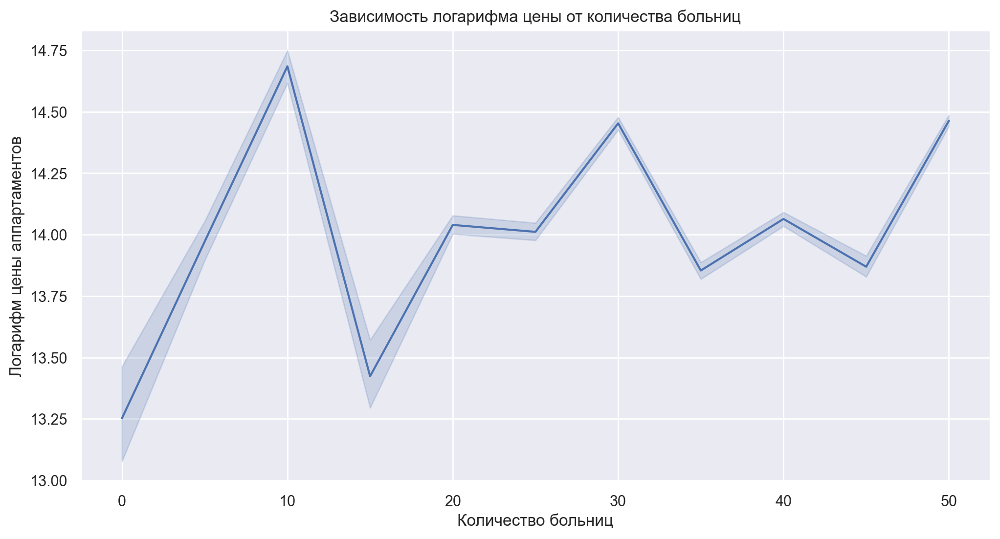

In [276]:
# Посмотрим на зависимость таргета от нового признака
print("Корреляция количества больниц в районе и цены на аппартаменты:", main.log_Price.corr(main.meds_count_group))
sns.lineplot(y=main.log_Price, x=main.meds_count_group)
plt.title('Зависимость логарифма цены от количества больниц')
plt.xlabel('Количество больниц')
plt.ylabel('Логарифм цены аппартаментов')
plt.show()

Конечно, корреляция вышла не такая большая и график не слишком линейным. Однако переменная, может, действительно оказаться значимой. 

Рассмотрим еще один новый признак - расстояние до метро. Данный [датасет](https://www.kaggle.com/datasets/thiagodsd/sao-paulo-metro) мы также взяли с kaggle. 

In [277]:
# Считываем датасет и преобразовываем его под наши требования
metro = pd.read_csv('metrosp_stations.csv')
metro = metro[['lat', 'lon']]
metro

,lat,lon
0,-23.597825,-46.652374
1,-23.650073,-46.704206
2,-23.641625,-46.699434
3,-23.602237,-46.612486
4,-23.581871,-46.638104
...,...,...
74,-23.589178,-46.634668
75,-23.531917,-46.530873
76,-23.584595,-46.583437
77,-23.600902,-46.527121


In [278]:
show_circles_on_map(metro.lat, metro.lon, color="midnightblue")

In [279]:
# Посчитаем расстояние в километрах от аппартаментов до каждой станции метро и найдем минимальное расстояние
def haversine_distance(latlon1, latlon2):
    R = 6371 
    lat1, lon1 = np.radians(latlon1[0]), np.radians(latlon1[1])
    lat2, lon2 = np.radians(latlon2[:, 0]), np.radians(latlon2[:, 1])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c


def calculate_min_distance(row, schools_coords):
    main_point = (row["Latitude"], row["Longitude"])
    distances = haversine_distance(main_point, schools_coords)
    return distances.min()

main["metro_distance"] = main.apply(lambda row: calculate_min_distance(row, metro.to_numpy()), axis=1)
main.head()


,ID,created_date,Price,below_price,Area,Adress,Bedrooms,Bathrooms,Parking_Spaces,extract_date,Latitude,Longitude,Center,log_Price,Coord_cell,meds_count,meds_count_group,metro_distance
0,2621660830,2021-02-08T20:20:19Z,539000,False,43,"Rua Coronel Luís Barroso 582, Santo Amaro - Sã...",1,1,1,2024-11-25,-23.647002,-46.704905,False,13.197473,7,26.0,25.0,0.348831
1,2735056019,2020-07-22T21:05:19Z,1149000,False,57,"Rua Fernão Dias 323, Pinheiros - São Paulo/SP",1,1,1,2024-11-25,-23.564136,-46.695173,False,13.954403,19,20.0,20.0,0.368268
2,2758506978,2024-11-12T13:41:55Z,255000,False,55,"Avenida Paes de Barros 411, Mooca - São Paulo/SP",1,1,1,2024-11-25,-23.559150,-46.599869,False,12.449023,21,49.0,45.0,1.604248
3,2753001806,2018-03-27T19:51:51Z,210000,False,42,"Rua Antônio Pais de Sande , Vila Mirante - São...",1,1,1,2024-11-25,-23.470334,-46.723179,False,12.254868,31,46.0,45.0,8.354520
4,2625825198,2018-03-30T02:50:40Z,640000,False,47,"Rua Doutor Jesuíno Maciel 2105, Campo Belo - S...",1,1,1,2024-11-25,-23.626811,-46.663730,False,13.369225,8,42.0,40.0,1.956513


Корреляция расстояния до метро и цены на аппартаменты: -0.16940099950040577


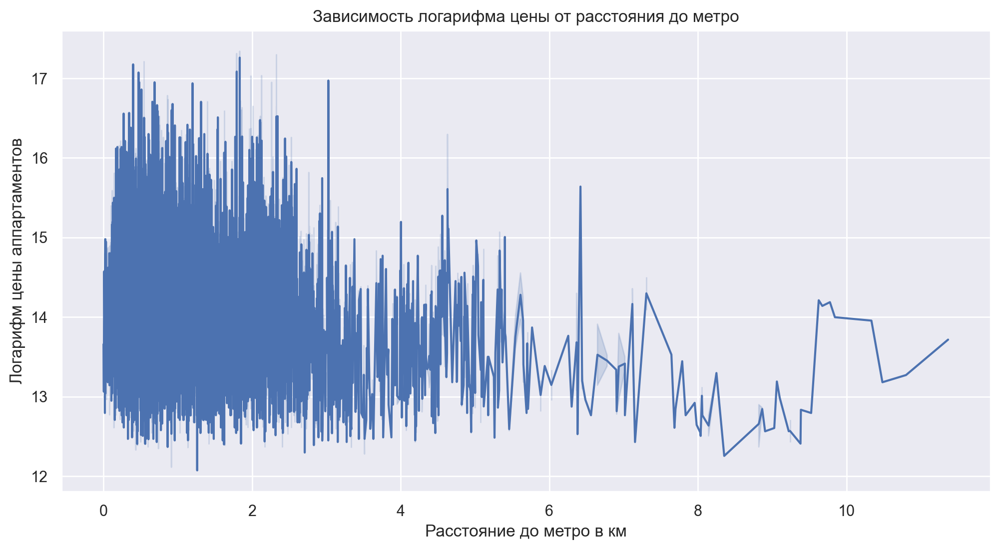

In [280]:
# Посмотрим на корреляцию нового признака и таргета и построим график зависимости
print("Корреляция расстояния до метро и цены на аппартаменты:", main.log_Price.corr(main.metro_distance))
sns.lineplot(y=main.log_Price, x=main.metro_distance)
plt.title('Зависимость логарифма цены от расстояния до метро')
plt.xlabel('Расстояние до метро в км')
plt.ylabel('Логарифм цены аппартаментов')
plt.show()

Видим слабую отрицательную корреляцию расстояния до метро и логарифма цены аппартаментов и очень шумный график. Посмотрим, что нам даст обучение.

### 3. Обучение

Наконец, мы можем перейти к обучению. Но для начала данные следует закодировать. Для категориальных признаков (квадраты координат) воспользуемся OneHotEncoder-ом - создадим еще n-ное количество дамми-переменных, каждая из которых отвечает за расположение аппартаментов в данном квадрате. Для числовых переменных (спальни, ванные, парковочные места, площадь, количество больниц в квадрате, расстояние до метро) воспользуемся StandardScaler-ом - отнормируем переменные.

In [281]:
# Подготовим данные для кодирования и обучения
main = main[["log_Price", "Price", "Coord_cell", "Bedrooms", "Bathrooms", "Parking_Spaces", "Area", "meds_count_group", "metro_distance", "Center"]]
X = main.drop(columns=["log_Price", "Price"])
y = main["log_Price"]
X.loc[X.Center == True, 'Center'] = 1
X.loc[X.Center == False, 'Center'] = 0
categorical = ["Coord_cell"]
numeric_features = ["Bedrooms", "Bathrooms", "Parking_Spaces", "Area", "meds_count_group", "metro_distance"]
already_ohe = ["Center"]

In [282]:
# Закодируем данные
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features),
    ('already_ohe', 'passthrough', already_ohe)
], remainder="drop")

X = pd.DataFrame(column_transformer.fit_transform(X).toarray(), columns=column_transformer.get_feature_names_out())
X

,ohe__Coord_cell_0,ohe__Coord_cell_1,ohe__Coord_cell_2,ohe__Coord_cell_3,ohe__Coord_cell_4,ohe__Coord_cell_5,ohe__Coord_cell_6,ohe__Coord_cell_7,ohe__Coord_cell_8,ohe__Coord_cell_9,...,ohe__Coord_cell_32,ohe__Coord_cell_33,ohe__Coord_cell_34,scaling__Bedrooms,scaling__Bathrooms,scaling__Parking_Spaces,scaling__Area,scaling__meds_count_group,scaling__metro_distance,already_ohe__Center
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,-1.925312,-1.355725,-1.013152,-1.209918,-0.778432,-0.821733,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-1.925312,-1.355725,-1.013152,-1.032825,-1.194499,-0.803788,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-1.925312,-1.355725,-1.013152,-1.058124,0.885837,0.337280,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-1.925312,-1.355725,-1.013152,-1.222568,0.885837,6.569195,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,-1.925312,-1.355725,-1.013152,-1.159320,0.469770,0.662494,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,-0.823458,0.097437,-0.099216,-0.526842,-0.778432,-0.226796,0.0
15499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-0.823458,0.097437,-0.099216,-0.286501,0.053703,1.320807,0.0
15500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-0.823458,0.097437,-0.099216,-0.767184,0.469770,-0.779471,0.0
15501,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-0.823458,0.097437,-0.099216,-0.552142,-1.194499,-0.599942,0.0


Наконец, давайте обучим множественную линейную регрессию и посмотрим на результаты.

In [283]:
X_sm = sm.add_constant(X)
model_sm = sm.OLS(y, X_sm).fit()
print(model_sm.summary())

                            OLS Regression Results                            
Dep. Variable:              log_Price   R-squared:                       0.719
Model:                            OLS   Adj. R-squared:                  0.718
Method:                 Least Squares   F-statistic:                     987.5
Date:                Fri, 13 Dec 2024   Prob (F-statistic):               0.00
Time:                        21:14:06   Log-Likelihood:                -8086.8
No. Observations:               15503   AIC:                         1.626e+04
Df Residuals:                   15462   BIC:                         1.657e+04
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [295]:
import pandas as pd
from docx import Document

model_results = pd.DataFrame({
    'Parameter': model_sm.params.index,
    'Estimate': model_sm.params.values,
    'Std Error': model_sm.bse.values,
    't-Statistic': model_sm.tvalues.values,
    'P-Value': model_sm.pvalues.values
})

doc = Document()
doc.add_heading('Результаты модели множественной линейной регрессии', 0)
table = doc.add_table(rows=1, cols=len(model_results.columns))
hdr_cells = table.rows[0].cells
for i, col_name in enumerate(model_results.columns):
    hdr_cells[i].text = col_name

for _, row in model_results.iterrows():
    row_cells = table.add_row().cells
    for i, value in enumerate(row):
        if isinstance(value, (int, float)):  
            row_cells[i].text = f"{value:.4f}"
        else: 
            row_cells[i].text = str(value)

doc.add_paragraph('\nR-squared: {:.4f}'.format(model_sm.rsquared))
doc.add_paragraph('Adjusted R-squared: {:.4f}'.format(model_sm.rsquared_adj))
doc.add_paragraph('F-statistic: {:.4f}'.format(model_sm.fvalue))
doc.add_paragraph('Prob (F-statistic): {:.4e}'.format(model_sm.f_pvalue))
doc.add_paragraph('Log-Likelihood: {:.4f}'.format(model_sm.llf))
doc.save('model_results.docx')
